# Cecilia Parsial Outlook
Cecilia Lieberia adalah salah satu vtuber yang merupakan talent dari agensi vtuber indonesia Re:Memories. per 28 oktober 2024 ~singkong~cecilia telah berkarir selama 2.6 tahun dan mendapatkan total subscriber 65,700 dengan views 2,308,214 dan menghasilkan konten sebanyak ~500 video.

In [4]:
import pandas as pd
import numpy as np
import json
import seaborn as sns
import matplotlib.pyplot as plt
import requests
from PIL import Image
from io import BytesIO
pd.set_option('display.max_columns', None)

In [5]:
PATH = 'data/'
with open('data/ch_data.json', 'r') as json_file:
    data_ch = json.load(json_file)
df_short = pd.read_csv(PATH+'data_shorts.csv')
df_vod = pd.read_csv(PATH+'data_vod.csv')
df_live = pd.read_csv(PATH+'data_live.csv')

In [6]:
df = pd.concat([df_live,df_short,df_vod],ignore_index=True)
del df_live,df_short,df_vod
index = df.loc[df['start_time(UTC)'].isna()].index
for idx in index:
    df['start_time(UTC)'].iat[idx] = df['published_date'].iat[idx]

df['start_time(UTC)'] = pd.to_datetime(df['start_time(UTC)'], utc=True)
df['published_date'] = pd.to_datetime(df['published_date'], utc=True)

# Define SMART Questions
1. Jenis konten (livestream/vod/shorts) yang memiliki potensi tinggi menjangkau audiens selama cecilia berkarir (lifetime)
2. Kinerja topik musik (lifetime) pada jenis konten yang memiliki potensi tinggi menjangkau audiens.
3. Identifikasi pola thumbnail pada 10 short teratas berdasarkan views.

# Jenis konten yang memiliki potensi menjangkau audiens selama cecilia berkarir
secara umum konten yang dibuat oleh cecilia lieberia meliki sebaran left skew dan mayoritas berada pada 0-8,121 views. jika dibandingkan dengan 65,700 subscriber maka mayoritas konten yang dibuat oleh cecilia masih belum berhasil menarik minat seluruh subscriber yang dimiliki maupun mencapai penonton diluar subscriber yang dimiliki, selain itu nilai batas atas IQR yang hanya 12% dari jumlah subscriber menunjukkan bahwa video yang berada di atas batas outlier masih dapat diterima sebagai batas kinerja konten yang cukup berhasil meskipun juga belum dapat mencapai potensi penuhnya.

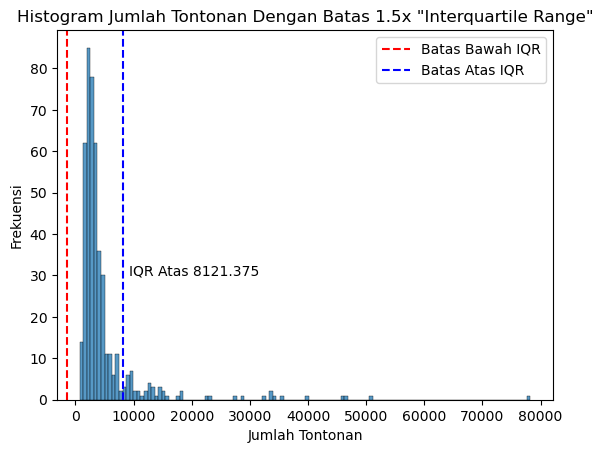

In [12]:
Q1 = df['view_count'].quantile(0.25)
Q3 = df['view_count'].quantile(0.75)
IQR = Q3 - Q1

# Define outlier boundaries
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR



# Create the histogram
sns.histplot(data=df,x='view_count',legend=True)
# for video_type in df['video_type'].unique():
#     sns.histplot(df[df['video_type'] == video_type], x='view_count', label=f"Video Type {video_type}")

# Add vertical lines for outlier boundaries
plt.axvline(lower_bound, color='red', linestyle='--', label='Batas Bawah IQR')
plt.axvline(upper_bound, color='blue', linestyle='--', label='Batas Atas IQR')
plt.text(upper_bound+1000,30,f'IQR Atas {upper_bound}')

# Add labels and title (optional)


# Add labels and title (optional)
plt.xlabel('Jumlah Tontonan')
plt.ylabel('Frekuensi')
plt.title('Histogram Jumlah Tontonan Dengan Batas 1.5x "Interquartile Range"')
plt.legend()

plt.show()

porsi terbesar jenis konten yang memiliki views dibawah IQR atas dimiliki oleh konten live streaming. dari 462 video sebanyak 409 berada di bawah batas atas 1.5x IQR dengan rincian sebagai berikut:
1. livestreaming 87.3% (357 video)
2. shorts 8.8% (36 video)
3. VoD 3.9% (16 video)

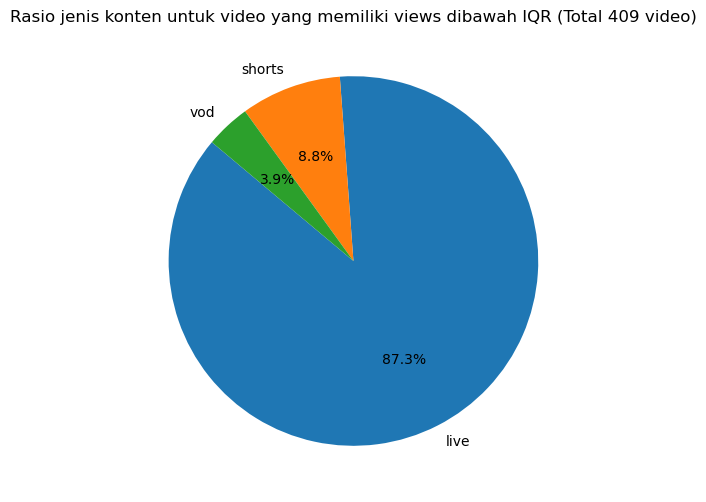

In [155]:
tmp = df.loc[df['view_count']<=upper_bound]
counts = tmp['video_type'].value_counts()
# counts
# counts.sum()
# Create the pie chart
plt.figure(figsize=(8, 6))
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140)

# Add a title
plt.title(f'Rasio jenis konten untuk video yang memiliki views dibawah IQR (Total {counts.sum()} video)')
plt.show()

Dalam 365 hari secara keseluruhan masih belum ada tipe konten yang memiliki tren pertumbuhan jumlah tontonan untuk jangka panjang.

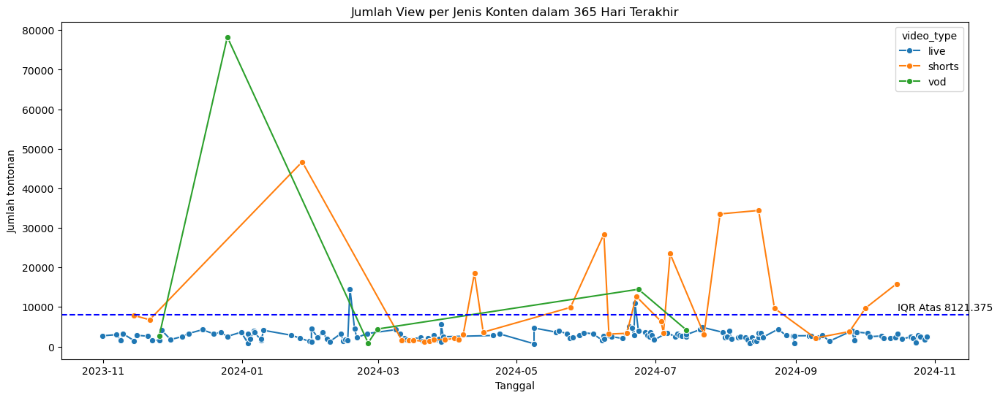

In [16]:
# ax = plt.figure(figsize=(8, 6))
max_date = df['start_time(UTC)'].max()

# Filter data untuk 100 hari terakhir
df_last_100_days = df[df['start_time(UTC)'] >= (max_date - pd.Timedelta(days=365))]

fig, ax1 = plt.subplots(1, 1, figsize=(16, 6))

# Plot lineplot pada ax1
sns.lineplot(data=df_last_100_days, x='start_time(UTC)', y='view_count', hue='video_type', ax=ax1,marker='o')
ax1.set_ylabel('Jumlah tontonan')
ax1.set_xlabel('Tanggal')
ax1.set_title('Jumlah View per Jenis Konten dalam 365 Hari Terakhir')
plt.axhline(upper_bound, color='blue', linestyle='--', label='Batas Atas IQR')
plt.text(df_last_100_days['start_time(UTC)'].iat[10],upper_bound+1000,f'IQR Atas {upper_bound}')



# Tampilkan plot
# plt.tight_layout()
plt.show()

Berdasarkan rasio ini konten shorts terlihat punya kencendurungan untuk mendapatkan konerja lebih baik untuk menjangkau audiens dibanding konten VoD atau Livestream.

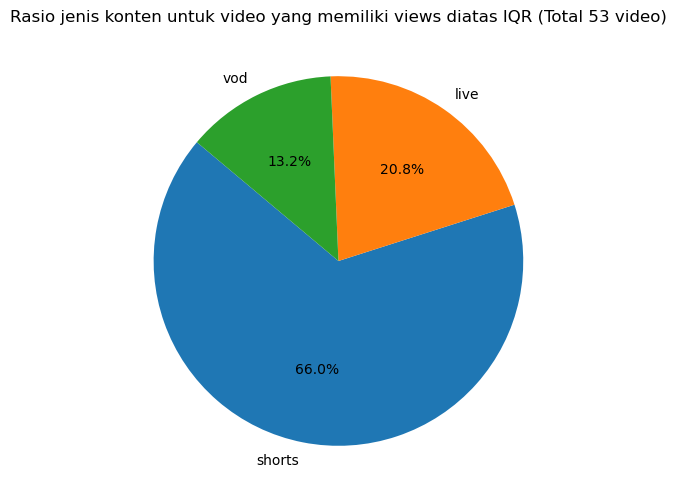

In [18]:
tmp = df.loc[df['view_count']>upper_bound]
counts = tmp['video_type'].value_counts()
counts.sum()
# Create the pie chart
plt.figure(figsize=(8, 6))
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140)

# Add a title
plt.title(f'Rasio jenis konten untuk video yang memiliki views diatas IQR (Total {counts.sum()} video)')
plt.show()

## Kinerja topik musik (lifetime) pada jenis konten yang memiliki potensi tinggi menjangkau audiens
Mari kita secara saksama konten shorts

1. Anime ini mirip kuru kuru? #shorts #honkaistarrail #herta #hoyoverse | 50948 | Oh7ZT9IKsB8 | 2023-06-14 12:00:23+00:00


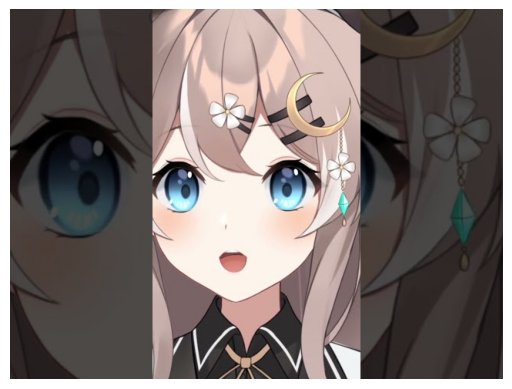

2. FANTECH x ONE PIECE!? LIMITED ITEM REVIEW LESGOOO!!! #Vtuber #shorts | 46715 | REu6lXBDndU | 2024-01-27 12:00:24+00:00


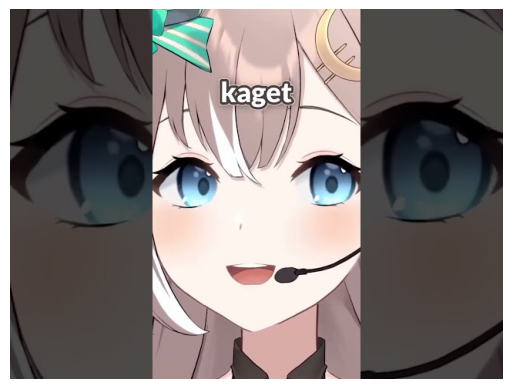

3. Pela aslinya anime jowo #shorts #pela #honkaistarrail #hoyoverse #kurukuru | 35551 | BfXn_Y50dYU | 2023-06-30 12:00:15+00:00


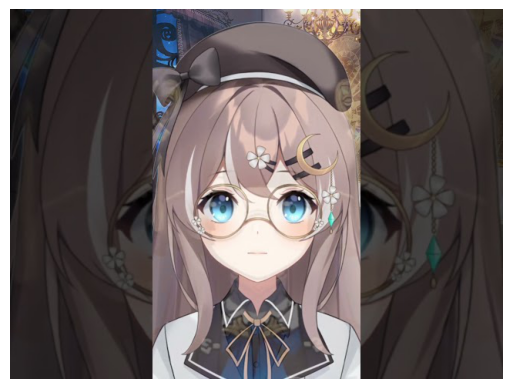

4. Gamer move Chained Alone #shorts #vtuber | 34414 | PzcGiISelyQ | 2024-08-15 11:00:20+00:00


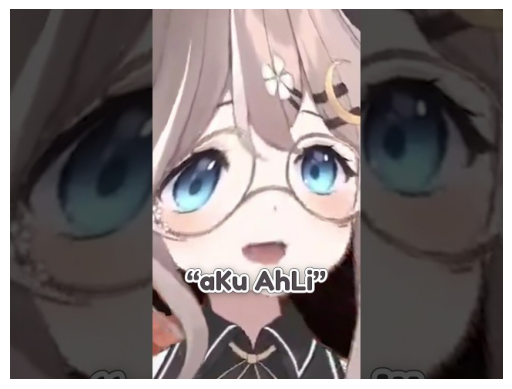

5. Nyoba Kutu Laut sampe mabok #shorts #vtuber #food | 33534 | 0g87goEwob4 | 2024-07-29 12:00:01+00:00


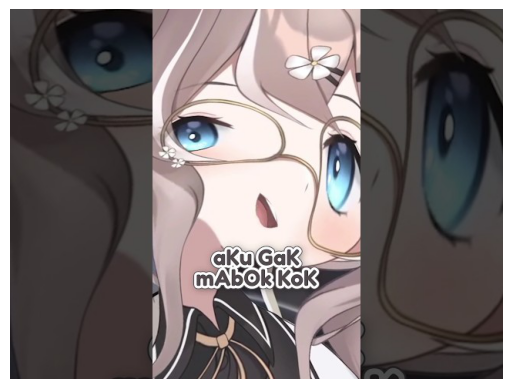

6. Ui's Loli Song, but... #しぐれうい #粛清 #trending #shorts | 32293 | XUy3Kbou4aY | 2023-09-27 08:00:23+00:00


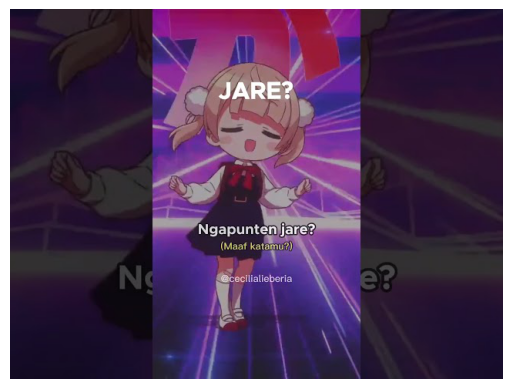

7. Loli jawa nyasar di Jepang #shorts #vtuber #jawa | 28415 | qBIGMJvfr-g | 2024-06-08 08:00:27+00:00


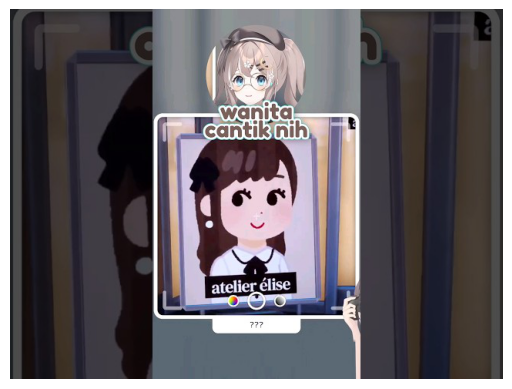

8. Jangan Lupa... | 27675 | 2kIb1ShcLQ8 | 2022-05-29 02:00:00+00:00


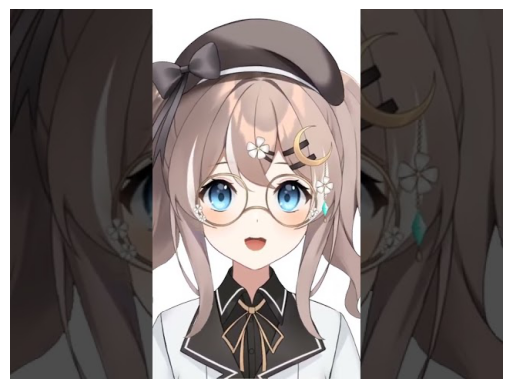

9. Jawa Baik vs Jawa Jahat #shorts #vtuber #meme | 23470 | xn7MB78WYck | 2024-07-07 12:04:42+00:00


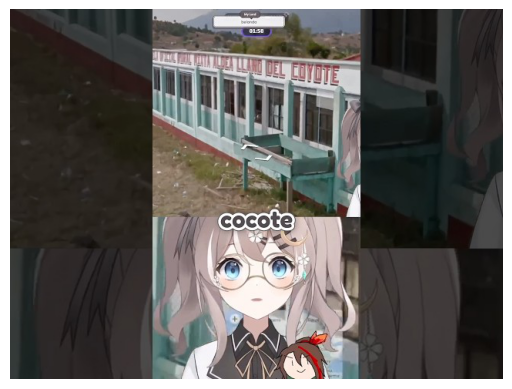

10. The Last Sebul Bender #shorts #meme | 18508 | E8-R9NEHQJg | 2024-04-12 07:57:15+00:00


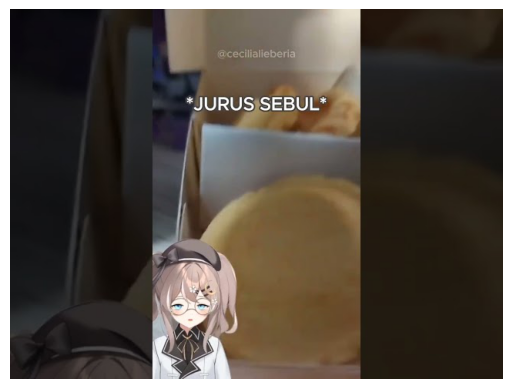

11. Mana tahan #shorts #everybody #backstreetboys | 18078 | GNuXq22fhgo | 2023-07-01 12:00:21+00:00


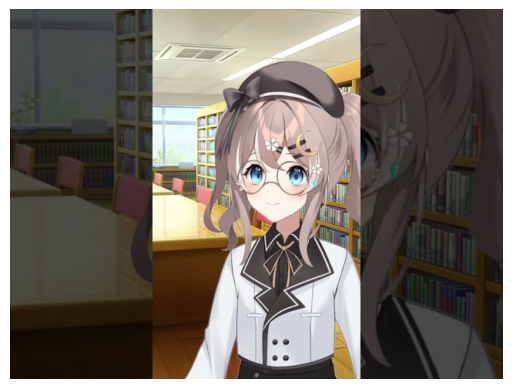

12. Nyasar nang Cafe Spy X Family!? #shorts #spyxfamily #vtuber | 15874 | FNzsr96Di2M | 2024-10-15 05:00:16+00:00


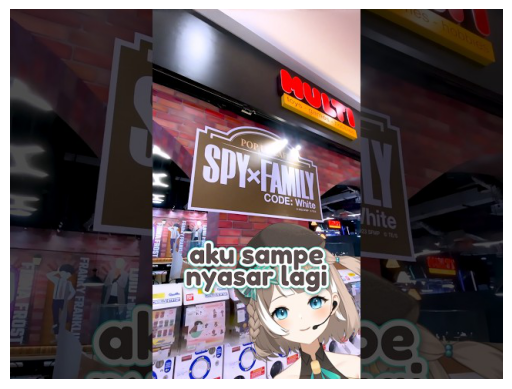

13. Kuru kuru jowo #shorts #kurukuru #honkaistarrail #hoyoverse | 15142 | tuJMcwDVcQY | 2023-06-22 12:00:51+00:00


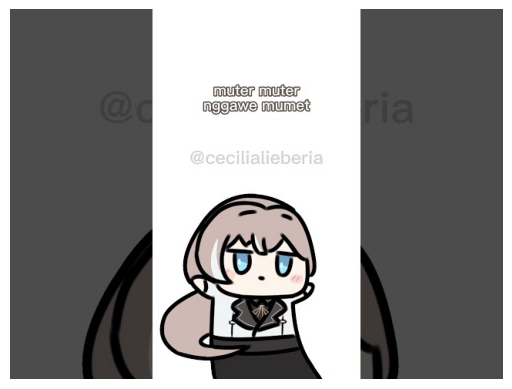

14. Gak Bolehh~ #shorts #anime | 15119 | Nfq_yathsG0 | 2022-12-27 12:30:07+00:00


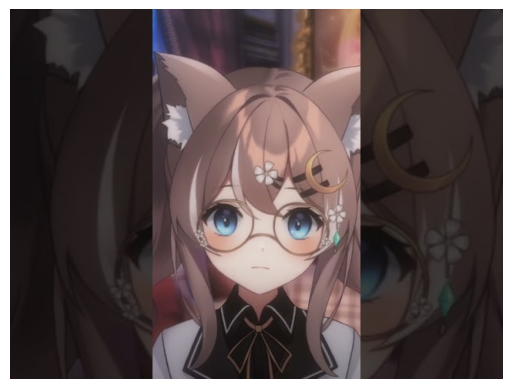

15. Password WiFi 2 #shorts | 14860 | jLDkjqF53LQ | 2022-12-15 12:00:18+00:00


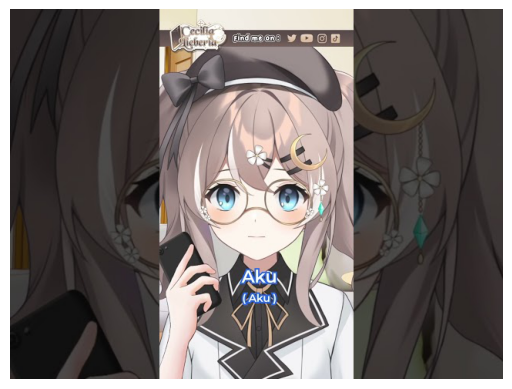

16. Teori skin Herta #shorts #herta #honkaistarrail | 14205 | o4ckcIdUs5Q | 2023-08-05 12:00:41+00:00


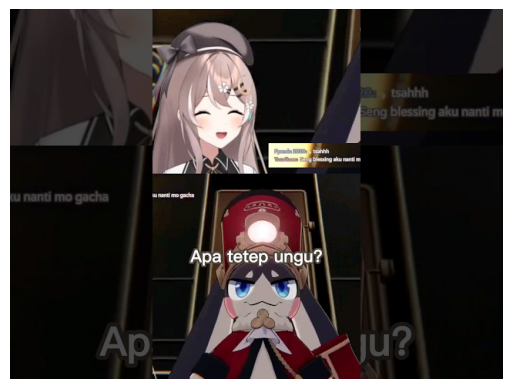

17. Jokes bapak-bapak pt.1 #shorts | 13227 | xvmcIgA1--Q | 2023-10-17 07:01:34+00:00


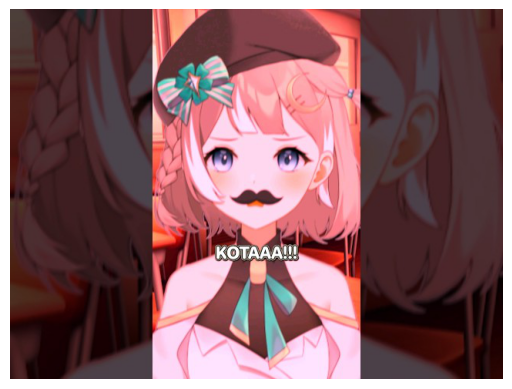

18. Vtuber Halal #shorts | 13155 | fXi7eVT0YkY | 2023-05-19 12:00:34+00:00


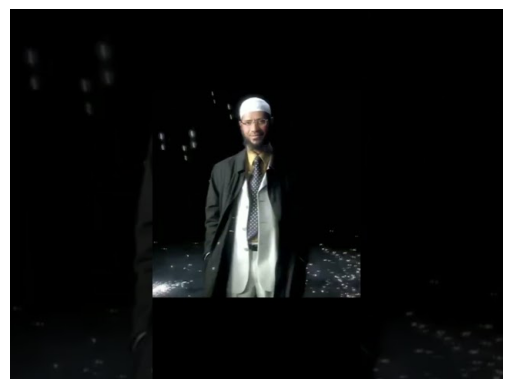

19. IDOL - Yoasobi (Jawa ver.) #shorts #idol #jowo | 13085 | V3IOvlDkaD4 | 2023-06-10 14:00:30+00:00


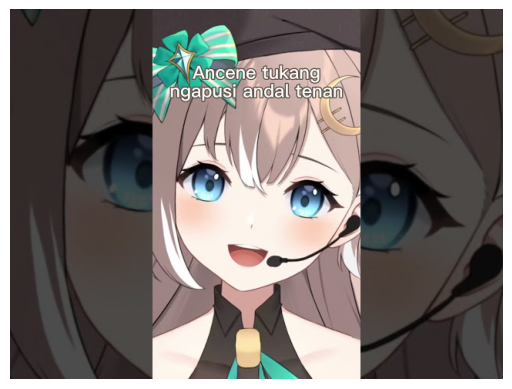

20. Aku ini ahli tidak skill issue #shorts #vtuber | 12693 | fncjylFmYEA | 2024-06-22 13:00:42+00:00


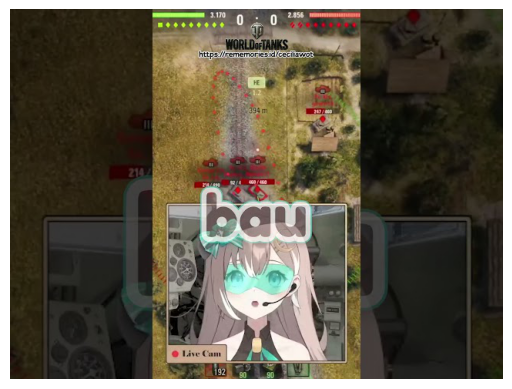

21. David Guetta & Bebe Rexha - I'm Good (Blue) #shorts #imgoodblue #vtuber | 12498 | MdEnsPbaCWU | 2023-09-10 13:20:48+00:00


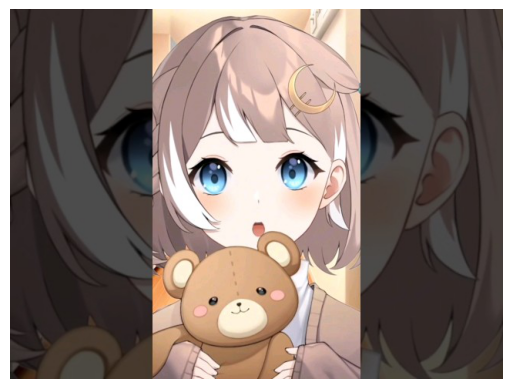

22. Jokes bapak-bapak pt.2 #shorts | 12402 | j_qQvJK5mC8 | 2023-10-24 07:01:04+00:00


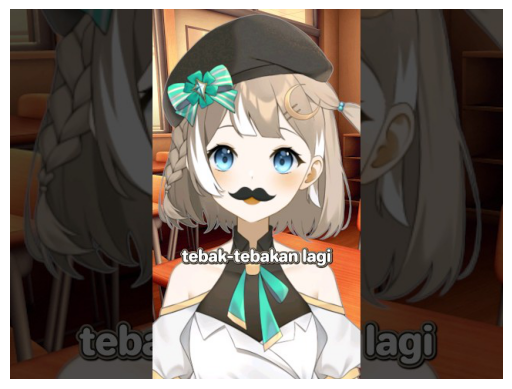

23. Ojo Dibandingke ✨ Vtuber Koplo ✨ | 11472 | lOEk05h7ufA | 2022-08-21 04:59:33+00:00


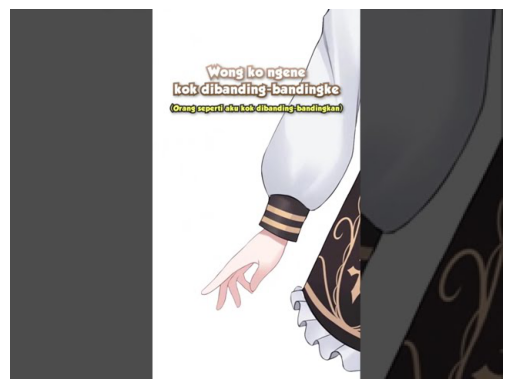

24. Iseng Dub Jowo : Oshi No Ko #shorts #oshinoko | 10781 | o4hI4GBQoMA | 2023-05-24 12:00:39+00:00


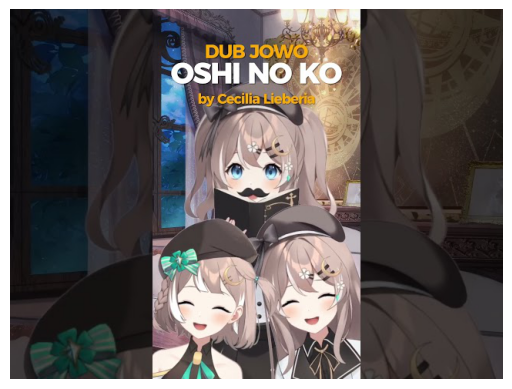

25. Badak dan Ikan ...? #shorts #vtuber #vtuberindo #wibu #anime #comedy | 10437 | pGQCJ9iAXsw | 2022-11-06 13:00:36+00:00
thumbnail not found
26. Password WiFi #shorts | 9979 | qgCtu1tGQsM | 2022-11-18 12:00:43+00:00


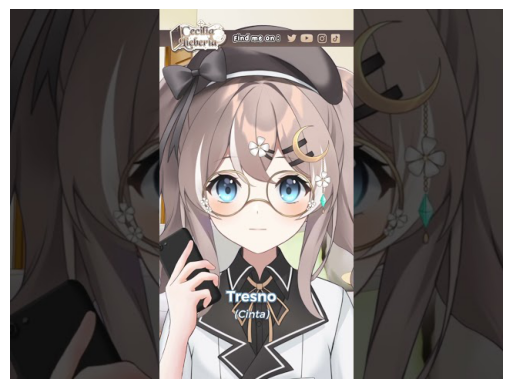

27. Aaa jangan dong 🥺 | 9901 | zIUNTZ9mZD8 | 2024-05-24 15:00:57+00:00


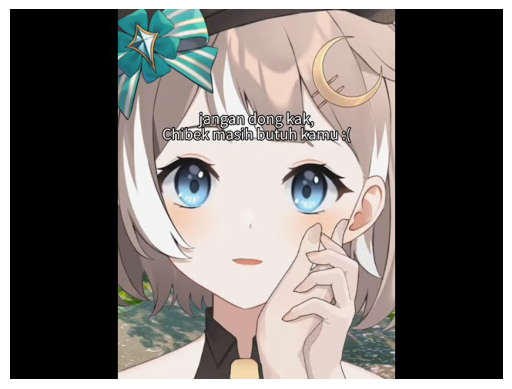

28. Ngenyek a kon? Pinjam seratus #shorts #javanese #jawa #voiceacting #loli | 9852 | P1nZm-8lb8w | 2023-07-16 03:25:17+00:00


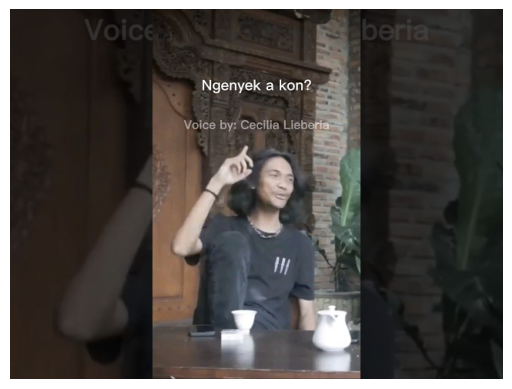

29. Roasting Cegil berkedok QnA #shorts #vtuber #qna | 9749 | jtglQh4B8VY | 2024-10-01 13:34:04+00:00


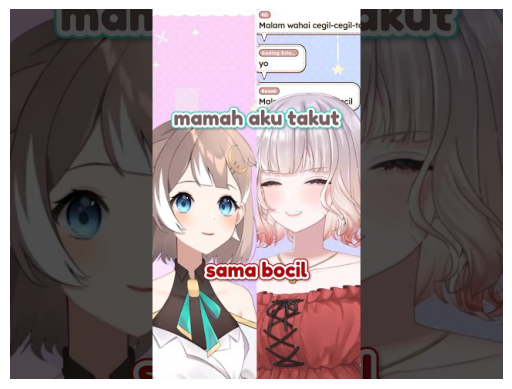

30. No OFFEND! #shorts | 9730 | LEKljmhiFMU | 2022-12-09 12:00:23+00:00


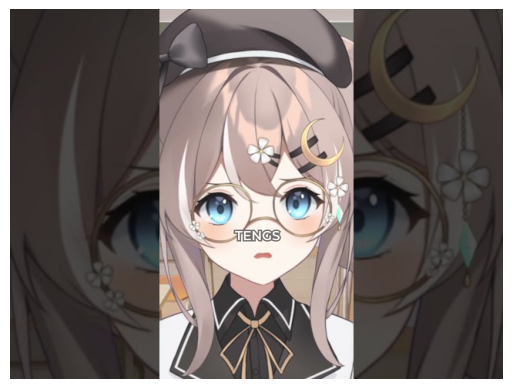

31. Vtuber penyabar #shorts #vtuber | 9679 | K-ZPqIs_F4c | 2024-08-22 10:30:14+00:00


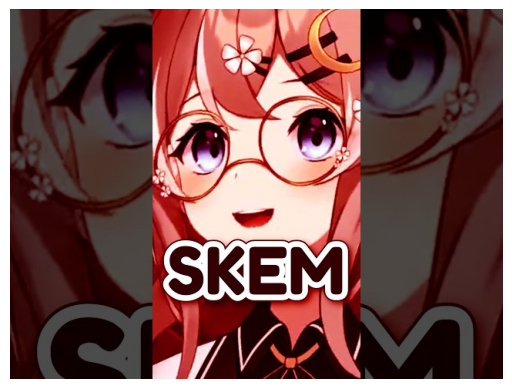

32. Anya, Haha inakute... #shorts #anime | 9572 | qCYKvdKGT9w | 2023-01-23 10:00:24+00:00


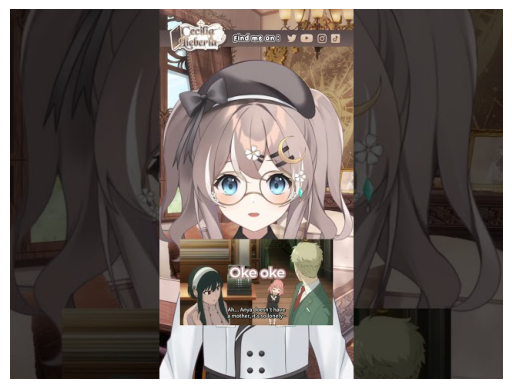

33. Alarm Sahuur~ #shorts | 9316 | wEheFVsXBhg | 2023-03-22 16:36:15+00:00


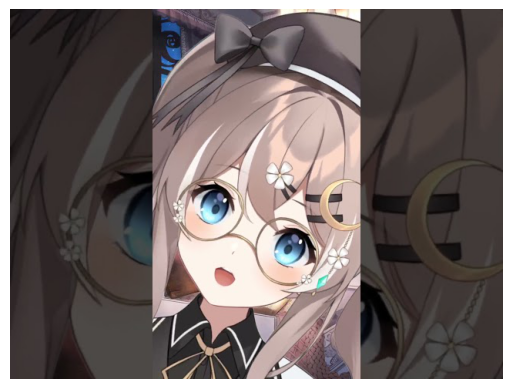

34. Japanese Goblin Parody #shorts #japanesegoblin #japanesesong | 9250 | fDV3nr60rjE | 2023-07-08 12:00:35+00:00


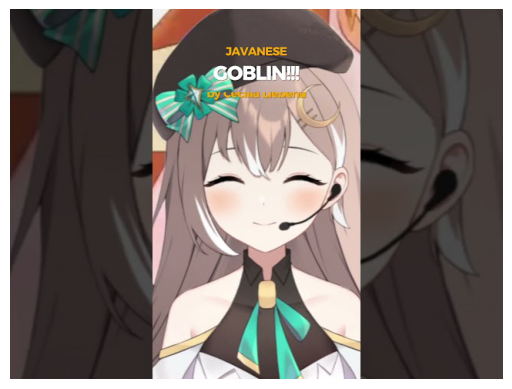

35. Vidcall karo ... #shorts | 8869 | GpCSmF_I-Zc | 2022-11-12 13:30:04+00:00


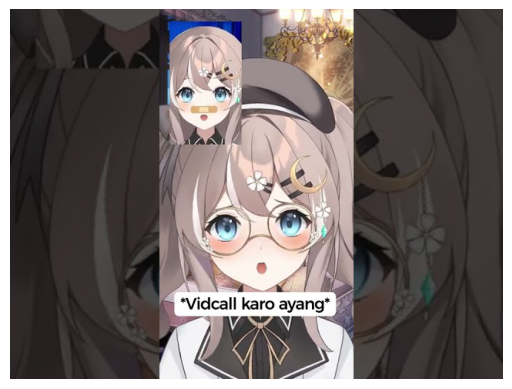

In [132]:
tmp = df.loc[(df['view_count']>=upper_bound)&(df['video_type']=='shorts')]
# tmp[tmp['thumbnail_url'].isna()]
tmp = tmp.sort_values(by='view_count',ascending=False)
counter = 1
for i, row in tmp.iterrows():
    print(f'{counter}. {row["video_title"]} | {row["view_count"]} | {row["video_id"]} | {row["start_time(UTC)"]}')

    # url = row["thumbnail_url"]
    if pd.isna(row["thumbnail_url"]):
        print('thumbnail not found')
    else:
        response = requests.get(row["thumbnail_url"])
        img = Image.open(BytesIO(response.content))
        # img_resized = img.resize((200, 250))
        plt.imshow(img)
        plt.axis('off')
        plt.show()
    # else:
    #     print('thumbnail not found')
    counter += 1
    

### Kinerja topik musik (lifetime) pada jenis konten yang memiliki potensi tinggi menjangkau audiens

#### Ui's Loli Song, but... #しぐれうい #粛清 #trending #shorts
- video id : XUy3Kbou4aY
- views : 32293
- tanggal rilis : 2023-09-27 08:00:23+00:00
  
judul konten memiliki 2 istilah pencarian untuk topik musik karya shigure ui dengan judul 'shukusei!!, loli kami requiem' yang sedang mengalami trend kenaikan sehingga shorts ini mendapatkan momentum yang cukup untuk dapat menjangkau audiens

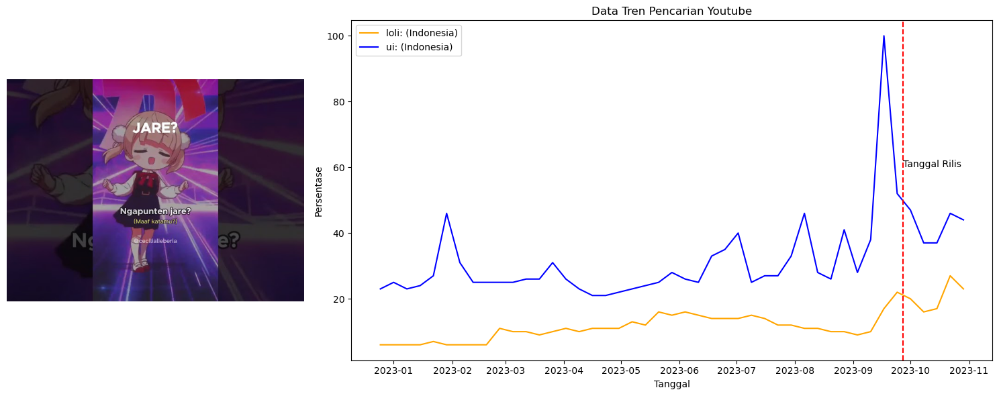

In [92]:
tmp = df.loc[df['video_id']=='XUy3Kbou4aY']
response = requests.get(tmp["thumbnail_url"].iat[0])
img = Image.open(BytesIO(response.content))
tmp=pd.read_csv('data/XUy3Kbou4aY.csv')
tmp['Minggu'] = pd.to_datetime(tmp['Minggu'])
fig = plt.figure(figsize=(15, 6))

# Create ax1 for the image (taking up 1/3 of the figure width)
ax1 = plt.subplot(1, 3, 1)
ax1.imshow(img)
ax1.axis('off')  # Hide axis for the image

# Create ax2 for the line plot (taking up the remaining 2/3 of the figure width)
ax2 = plt.subplot(1, 3, (2, 3))
sns.lineplot(data=tmp.iloc[-45:], x='Minggu', y='loli: (Indonesia)', color='orange', ax=ax2, label='loli: (Indonesia)')
sns.lineplot(data=tmp.iloc[-45:], x='Minggu', y='ui: (Indonesia)', color='blue', ax=ax2, label='ui: (Indonesia)')

# sns.regplot(data=tmp.iloc[-20:], x='Minggu', y='loli: (Indonesia)', color='darkorange', ax=ax2, label='loli: (Indonesia)',scatter=False)
# sns.lineplot(data=tmp.iloc[-20:], x='Minggu', y='ui: (Indonesia)', color='darkblue', ax=ax2, label='ui: (Indonesia)',scatter=False)
ax2.set_title("Data Tren Pencarian Youtube")
ax2.set_xlabel("Tanggal")
ax2.set_ylabel("Persentase")
ax2.legend()
ax2.axvline(pd.to_datetime('2023-09-27'), color='red', linestyle='--', label='Tanggal Rilis')
ax2.text(pd.to_datetime('2023-09-27'),60,'Tanggal Rilis')

plt.tight_layout()
plt.show()

#### IDOL - Yoasobi (Jawa ver.) #shorts #idol #jowo
- video id : V3IOvlDkaD4.
- views : 13085.
- tanggal rilis : 2023-06-10 14:00:30+00:00.
  
judul konten memiliki 2 istilah pencarian untuk topik musik karya yoasobi dengan judul 'IDOL' yang sedang mengalami trend penurunan ketika di rilis, sehingga shorts ini tidak mendapatkan momentum yang cukup untuk menjangkau audiens.

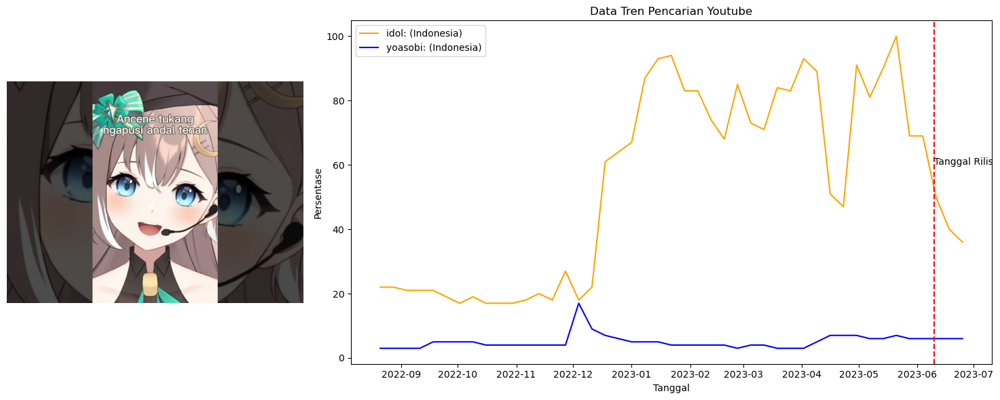

In [94]:
# tmp = df.loc[df['video_id']=='V3IOvlDkaD4']
tmp = df.loc[df['video_id']=='V3IOvlDkaD4']
response = requests.get(tmp["thumbnail_url"].iat[0])
img = Image.open(BytesIO(response.content))
tmp=pd.read_csv('data/V3IOvlDkaD4.csv')
tmp['Minggu'] = pd.to_datetime(tmp['Minggu'])
# tmp
fig = plt.figure(figsize=(15, 6))

# Create ax1 for the image (taking up 1/3 of the figure width)
ax1 = plt.subplot(1, 3, 1)
ax1.imshow(img)
ax1.axis('off')  # Hide axis for the image

# Create ax2 for the line plot (taking up the remaining 2/3 of the figure width)
ax2 = plt.subplot(1, 3, (2, 3))
sns.lineplot(data=tmp.iloc[-45:], x='Minggu', y='idol: (Indonesia)', color='orange', ax=ax2, label='idol: (Indonesia)')
sns.lineplot(data=tmp.iloc[-45:], x='Minggu', y='yoasobi: (Indonesia)', color='blue', ax=ax2, label='yoasobi: (Indonesia)')
ax2.set_title("Data Tren Pencarian Youtube")
ax2.set_xlabel("Tanggal")
ax2.set_ylabel("Persentase")
ax2.legend()
ax2.axvline(pd.to_datetime('2023-06-10'), color='red', linestyle='--', label='Tanggal Rilis')
ax2.text(pd.to_datetime('2023-06-10'),60,'Tanggal Rilis')


plt.tight_layout()
plt.show()

#### Ojo Dibandingke ✨ Vtuber Koplo ✨
- video id : lOEk05h7ufA.
- views : 11472.
- tanggal rilis : 2022-08-21 04:59:33+00:00.

Judul konten memiliki 3 istilah pencarian untuk topik musik dengan judul 'ojo dibandingke' yang sedang berada dipuncak lonjakan trend dan genre koplo yang sedang mengalami penurunan. meskipun memiliki momentum yang sangat besar waktu shorts ini rilis, tetapi masih tidak dapat menjangkau audiens secara luas. penulis berpendapat bahwa shorts ini salah menargetkan audiens dengan asusmsi "sedikit peminat musik koplo yang menyukai vtuber atau hanya sedikit peminat vtuber yang menyukai musik koplo", tentu saja untuk menjawab kemungkinan ini perlu adanya riset lanjutan

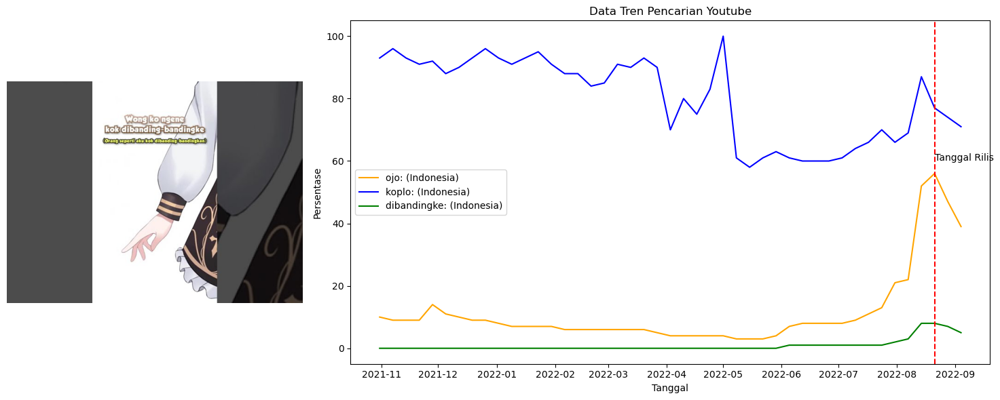

In [128]:
tmp = df.loc[df['video_id']=='lOEk05h7ufA']
response = requests.get(tmp["thumbnail_url"].iat[0])
img = Image.open(BytesIO(response.content))
tmp=pd.read_csv('data/lOEk05h7ufA.csv')
tmp['Minggu'] = pd.to_datetime(tmp['Minggu'])
tmp['dibandingke: (Indonesia)'] = tmp['dibandingke: (Indonesia)'].apply(lambda x: 0 if x == '<1' else x)
tmp['dibandingke: (Indonesia)'] = tmp['dibandingke: (Indonesia)'].astype(int)
# tmp
fig = plt.figure(figsize=(15, 6))

# Create ax1 for the image (taking up 1/3 of the figure width)
ax1 = plt.subplot(1, 3, 1)
ax1.imshow(img)
ax1.axis('off')  # Hide axis for the image

# Create ax2 for the line plot (taking up the remaining 2/3 of the figure width)
ax2 = plt.subplot(1, 3, (2, 3))
sns.lineplot(data=tmp.iloc[-45:], x='Minggu', y='ojo: (Indonesia)', color='orange', ax=ax2, label='ojo: (Indonesia)')
sns.lineplot(data=tmp.iloc[-45:], x='Minggu', y='koplo: (Indonesia)', color='blue', ax=ax2, label='koplo: (Indonesia)')
sns.lineplot(data=tmp.iloc[-45:], x='Minggu', y='dibandingke: (Indonesia)', color='green', ax=ax2, label='dibandingke: (Indonesia)')

ax2.set_title("Data Tren Pencarian Youtube")
ax2.set_xlabel("Tanggal")
ax2.set_ylabel("Persentase")
ax2.legend()
ax2.axvline(pd.to_datetime('2022-08-21'), color='red', linestyle='--', label='Tanggal Rilis')
ax2.text(pd.to_datetime('2022-08-21'),60,'Tanggal Rilis')


plt.tight_layout()
plt.show()

## Identifikasi pola thumbnail pada 10 short teratas berdasarkan views.
dari visualisasi bagian sebelumnya, ada 2 shorts yang berpola sama, yaitur distorsi. topik kedua shorts itu berbeda, meskipun begitu keduanya dapat menempati posisi 10 teratas bedasarkan views. perlunya melakukan kurasi lebih lanjut untuk melakukan analisis mendalam. mengingat keterbatasan sumberdaya penulis, analisis lanjutan tidak akan muncul dalam waktu dekat.